In [1]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import shap

import pe_utils as helper

import matplotlib as mpl
import matplotlib.pyplot as plt
import json

import seaborn as sns
font_size = 10
rc={'font.size': font_size, 'axes.labelsize': font_size, 'figure.dpi':400, 'axes.linewidth':0.5,
    'axes.titlesize': font_size, 'xtick.labelsize': font_size, 'ytick.labelsize': font_size} # 'figure.figsize':(11.7/1.5,8.27/1.5)

sns.set(style='ticks',rc=rc) #talk, ticks, paper
sns.set_context("paper")

mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

mpl.rcParams['font.sans-serif'] = "Arial"
mpl.rcParams['font.family'] = "sans-serif"
plt.rcParams['axes.unicode_minus']=False # negative minus sign
plt.rcParams['axes.grid'] = False

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=300, facecolor='white')

%matplotlib inline

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.21.5 scipy==1.9.1 pandas==1.4.4 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.10.2 pynndescent==0.5.7


In [3]:
import pickle
with open('pseudo5-final-results.pkl','rb') as f:
    res = pickle.load(f)

In [4]:
# cell_types = ['Total_B', 'Total_T_NK', 'Total_Mono', 'cd4_tn2', 'cd8_tn2','Treg']
# clses = ['B', 'T and NK', 'Mono', 'CD4+ TN2', 'CD8+ TN2', 'Treg']
# cls_color = ['#ff7f00','#4daf4a','#984ea3','#377eb8', '#e41a1c','#AA8B56']
cell_types = ['Total_Mono', 'cd4_tn2', 'cd8_tn2','Treg']
clses = ['Total Mono', 'CD4+ Tn2', 'CD8+ Tn2', 'Treg']
cls_color = ['#984ea3','#377eb8', '#e41a1c','#AA8B56']
palette = dict(zip(clses, cls_color))

# train performance

In [5]:
scoring = ['F1_weight', 'AUC']  # best model is determined according to F1_weight
n_cv = 5

trn_score_col = []
for s in scoring:
    for i in range(n_cv):
        trn_score_col.append('split{0}_test_{1}'.format(i, s))

In [6]:
res['Total_B']['train_res'].columns

Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_n_estimators', 'param_min_samples_split',
       'param_min_samples_leaf', 'param_max_depth', 'params',
       'split0_test_F1_weight', 'split1_test_F1_weight',
       'split2_test_F1_weight', 'split3_test_F1_weight',
       'split4_test_F1_weight', 'mean_test_F1_weight', 'std_test_F1_weight',
       'rank_test_F1_weight', 'split0_train_F1_weight',
       'split1_train_F1_weight', 'split2_train_F1_weight',
       'split3_train_F1_weight', 'split4_train_F1_weight',
       'mean_train_F1_weight', 'std_train_F1_weight', 'split0_test_AUC',
       'split1_test_AUC', 'split2_test_AUC', 'split3_test_AUC',
       'split4_test_AUC', 'mean_test_AUC', 'std_test_AUC', 'rank_test_AUC',
       'split0_train_AUC', 'split1_train_AUC', 'split2_train_AUC',
       'split3_train_AUC', 'split4_train_AUC', 'mean_train_AUC',
       'std_train_AUC'],
      dtype='object')

In [7]:
res['Total_B']['train_res'].shape

(50, 39)

In [8]:
cell_names=[]
f1_s = []
auc_s = []
for i, x_type in enumerate(cell_types):
    x = res[x_type]['train_res']
    f1_scores = x[x['rank_test_{0}'.format(scoring[0])]==1][trn_score_col[:n_cv]].values[0].tolist()
    f1_s.extend(f1_scores)
    
    auc_scores = x[x['rank_test_{0}'.format(scoring[0])]==1][trn_score_col[n_cv:]].values[0].tolist()
    auc_s.extend(auc_scores)
    
    cell_names.extend([clses[i]] * n_cv)
    
trn_df = pd.DataFrame(index=range(len(cell_names)))
trn_df['cell_type']=cell_names
trn_df['f1_score']=f1_s

In [9]:
trn_df.groupby('cell_type').agg(['mean', 'std'])

f1_score          
                mean       std
cell_type                     
CD4+ Tn2    0.929479  0.045173
CD8+ Tn2    0.932353  0.014224
Total Mono  0.910335  0.052251
Treg        0.843426  0.081801

In [10]:
def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_width()
        diff = current_width - new_value

        # we change the bar width
        patch.set_width(new_value)

        # we recenter the bar
        patch.set_x(patch.get_x() + diff * .5)

def bar_plot(data, x='cell_type', y='f1_score', order=clses, title='Train Set', y_label='F1 Weighted Score', save_path="plots/Figure_S1_Train_F1.pdf", palette=palette, edgecolor=cls_color):
    plot_param={
        'data':data,
        'x':x,
        'y':y,
        'order':order,
        'orient':'v'
    }

    fig, axs = plt.subplots(1,1,figsize=(3,3.5))
    axa = sns.barplot(**plot_param,ax=axs,
                      palette=palette,saturation=1,
                      linewidth=1,
                      ci='sd', # 68: SEM (The Standard Error of Mean)
                      capsize=0.25,errwidth=1,
                      zorder=5,edgecolor=edgecolor) 
    change_width(axa, 0.65)
    xticklabels = axa.set_xticklabels(axa.get_xticklabels(),rotation=30, ha='right',rotation_mode="anchor")
    sns.despine()
    
    axa.grid(False)
    axa.set_xlabel('')
    axa.set_ylabel(y_label)
    axa.set_title(title)

    plt.savefig(save_path, dpi=400, bbox_inches='tight', format='pdf')

meta NOT subset; don't know how to subset; dropped


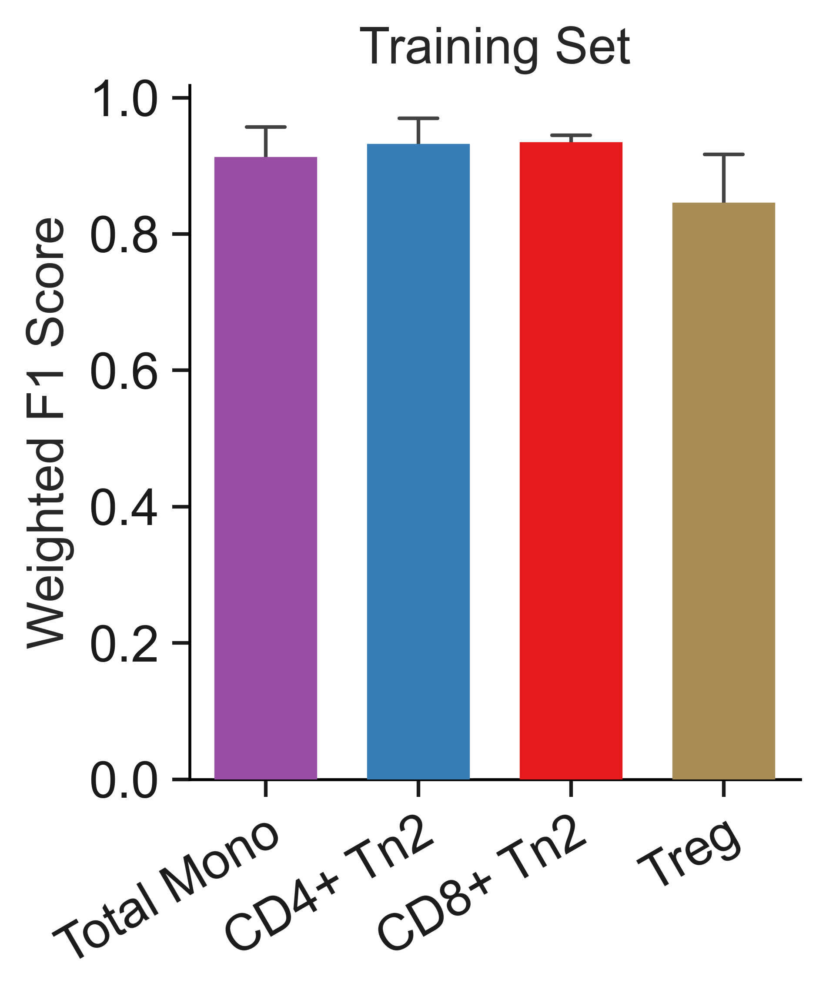

In [28]:
bar_plot(trn_df, y='f1_score', y_label='Weighted F1 Score', title='Training Set', save_path="plots/Figure_S1_Train_F1.pdf")

# bar_plot(trn_df, y='auc_score', order='clses', y_label='AUC', save_path="plots/Figure_S1_Train_AUC.pdf")

In [12]:
i_model=res['Total_B']['best_model']

In [13]:
i_model

RandomForestClassifier(class_weight={0: 0.6790123456790124,
                                     1: 1.896551724137931},
                       max_depth=18, min_samples_leaf=4, min_samples_split=10,
                       n_estimators=200, random_state=123)

In [14]:
from sklearn import metrics
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.utils import resample

def cal_roc_train(res, cell_types, mean_fpr):

    n_splits = 5
    cv = StratifiedKFold(n_splits=n_splits, random_state=123,shuffle=True)

    auc_dict = {}

    for kkey in cell_types:
        i_x_tr=res[kkey]['pd_X_tr']
        i_y_tr=res[kkey]['y_tr']
        i_model=res[kkey]['best_model']
        # rfc = RandomForestClassifier(class_weight=helper.get_class_weight(i_y_tr),random_state=123)
        # rfc.set_params(**res[kkey]['best_param'])

        auc_all = []
        tprs = []
        thres=[]
        y_pred_prob=[]
        y_ture = []

        resxx = {}

        for fold, (trn_train, trn_val) in enumerate(cv.split(i_x_tr, i_y_tr)):
            # to plot the CV performance
            i_model.fit(i_x_tr.iloc[trn_train], i_y_tr[trn_train])
            # rfc.fit(i_x_tr.iloc[trn_train], i_y_tr[trn_train])

            ii_y_predp = i_model.predict_proba(i_x_tr.iloc[trn_val])[:,1]
            
            y_pred_prob.append(ii_y_predp.tolist())
            y_ture.append(i_y_tr[trn_val].tolist())
            
            i_fpr, i_tpr, i_thre = metrics.roc_curve(i_y_tr[trn_val], ii_y_predp)

            i_auc = metrics.auc(i_fpr, i_tpr)
            auc_all.append(i_auc)

            interp_tpr = np.interp(mean_fpr, i_fpr, i_tpr)
            interp_tpr[0] = 0.0

            interp_thres = np.interp(mean_fpr, i_fpr, i_thre)

            tprs.append(interp_tpr)
            thres.append(interp_thres)

        resxx['auc']=auc_all
        resxx['tprs']=np.mean(tprs,axis=0)
        resxx['tprs'][-1]=1.0
        resxx['tprs_std']=np.std(tprs,axis=0)
        resxx['thres']=np.mean(thres,axis=0)
        resxx['mean_auc']=np.mean(auc_all)
        resxx['std_auc']=np.std(auc_all)
        resxx['y_pred_prob']=y_pred_prob
        resxx['y_ture']=y_ture

        auc_dict[kkey]=resxx
        
    return auc_dict

def cal_roc_test(res, cell_types, mean_fpr):
    auc_dict = {}

    # mean_fpr2 = np.linspace(0, 1, 500,endpoint=True)

    for kkey in cell_types:
        i_x_test=res[kkey]['pd_X_te']
        i_y_test=res[kkey]['y_te']
        i_model=res[kkey]['best_model']

        i_len=len(i_y_test)


        auc_all = []
        tprs = []
        thres=[]
        y_pred_prob=[]
        y_ture = []

        resxx = {}

        for i in range(1,101):
            ii_x,ii_y=resample(i_x_test, i_y_test,n_samples=i_len, stratify=i_y_test, random_state=i+123)
            ii_y_predp = i_model.predict_proba(ii_x)[:,1]
            
            y_pred_prob.append(ii_y_predp.tolist())
            y_ture.append(ii_y.tolist())
            
            i_fpr, i_tpr, i_thre = metrics.roc_curve(ii_y, ii_y_predp)

            i_auc = metrics.auc(i_fpr, i_tpr)
            auc_all.append(i_auc)

            interp_tpr = np.interp(mean_fpr, i_fpr, i_tpr)
            interp_tpr[0] = 0.0

            interp_thres = np.interp(mean_fpr, i_fpr, i_thre)

            tprs.append(interp_tpr)
            thres.append(interp_thres)

        resxx['auc']=auc_all
        resxx['tprs']=np.mean(tprs,axis=0)
        resxx['tprs_std']=np.std(tprs,axis=0)
        resxx['tprs'][-1]=1.0
        resxx['thres']=np.mean(thres,axis=0)
        resxx['mean_auc']=np.mean(auc_all)
        resxx['std_auc']=np.std(auc_all)
        resxx['y_pred_prob']=y_pred_prob
        resxx['y_ture']=y_ture

        auc_dict[kkey]=resxx
    return auc_dict


def plot_roc(cell_types, auc_dict, mean_fpr, clses, title, save_path="plots/Fig_roc.pdf", show_threshod=True):
    spaces = [17, 5, 11,3,3,13]
    fig, ax = plt.subplots(1,1,figsize=(4.5,3.5))
    ax.grid(False)

    for i,kkey in enumerate(cell_types):
        tprs = auc_dict[kkey]['tprs']
        lb = clses[i] + ' '*spaces[i]+r'{0:.3f}$\pm${1:.3f}'.format(auc_dict[kkey]['mean_auc'],auc_dict[kkey]['std_auc'])
        ax.plot(mean_fpr, tprs, label='{0}'.format(lb), color=cls_color[i], lw=1)
        
        # tprs_upper = np.minimum(tprs + auc_dict[kkey]['tprs_std'], 1)
        # tprs_lower = np.maximum(tprs - auc_dict[kkey]['tprs_std'], 0)
        # ax.fill_between(
        #     mean_fpr,
        #     tprs_lower,
        #     tprs_upper,
        #     color=cls_color[i],
        #     alpha=0.2,
        # )
        
        if show_threshod:
            J = tprs-mean_fpr
            j_ix = np.argmax(J)

            auc_dict[kkey]['opt_thre'] = auc_dict[kkey]['thres'][j_ix]
        
            ax.plot(mean_fpr[j_ix], tprs[j_ix], 'o', color=cls_color[i], markersize=2)

            ax.plot([mean_fpr[j_ix], 0.28], [tprs[j_ix], 0.70], color='k', linestyle='-', lw=0.5)

            if i == 1:
                t=ax.text(0.28+0.01, tprs[j_ix]-0.25, 'Optimal Threshold', fontsize=8)
                t.set_bbox(dict(facecolor='grey', alpha=0.2, edgecolor='grey',boxstyle="round"))
        else:
            auc_dict[kkey]['opt_thre'] = 0.5

    ax.plot([0, 1], [0, 1], linestyle="--", lw=1, color="k", alpha=0.8)
    ax.set(xlim=[-0.05, 1.05],ylim=[-0.05, 1.05])
    sns.despine()
    # ax.set_aspect('equal','box')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(title)
    ax.legend(loc="lower right",title='AUROC',title_fontsize=8,fontsize=8)#,frameon=False)
    plt.savefig(save_path, dpi=400, bbox_inches='tight', pad_inches = 0.1)
    

meta NOT subset; don't know how to subset; dropped


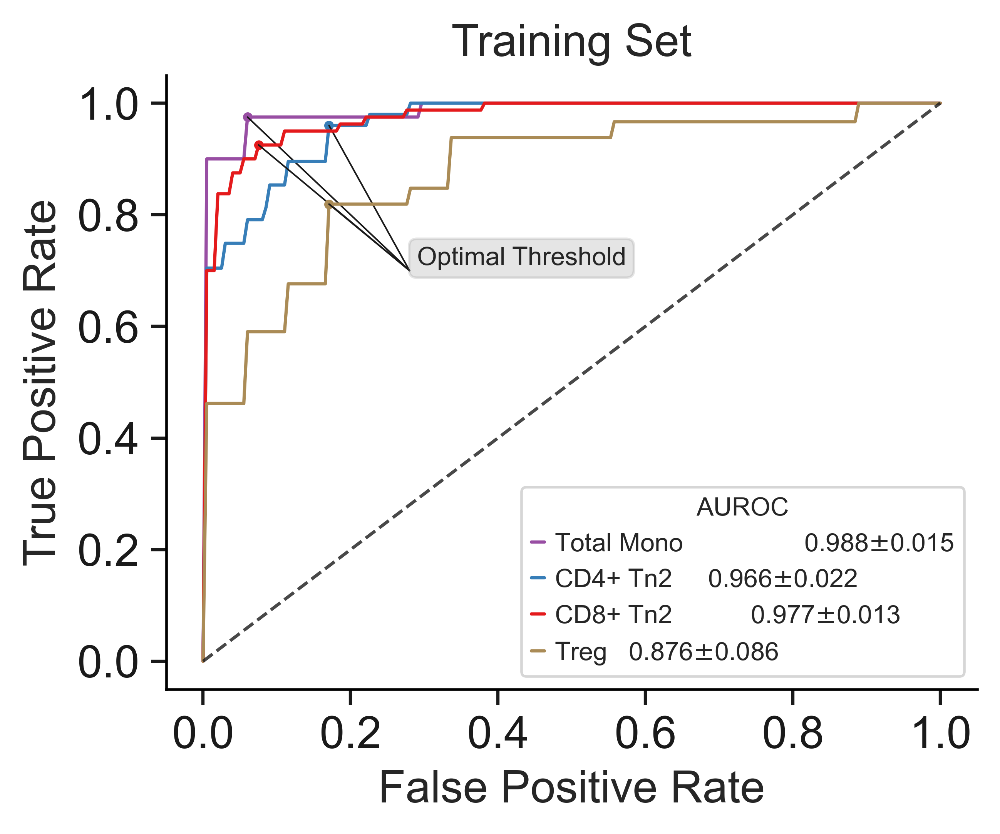

In [15]:
mean_fpr = np.linspace(0, 1, 200,endpoint=True)
auc_dict_train = cal_roc_train(res, cell_types, mean_fpr)
plot_roc(cell_types, auc_dict_train, mean_fpr, clses,'Training Set', save_path="plots/Fig_roc_train.pdf", show_threshod=True)

meta NOT subset; don't know how to subset; dropped


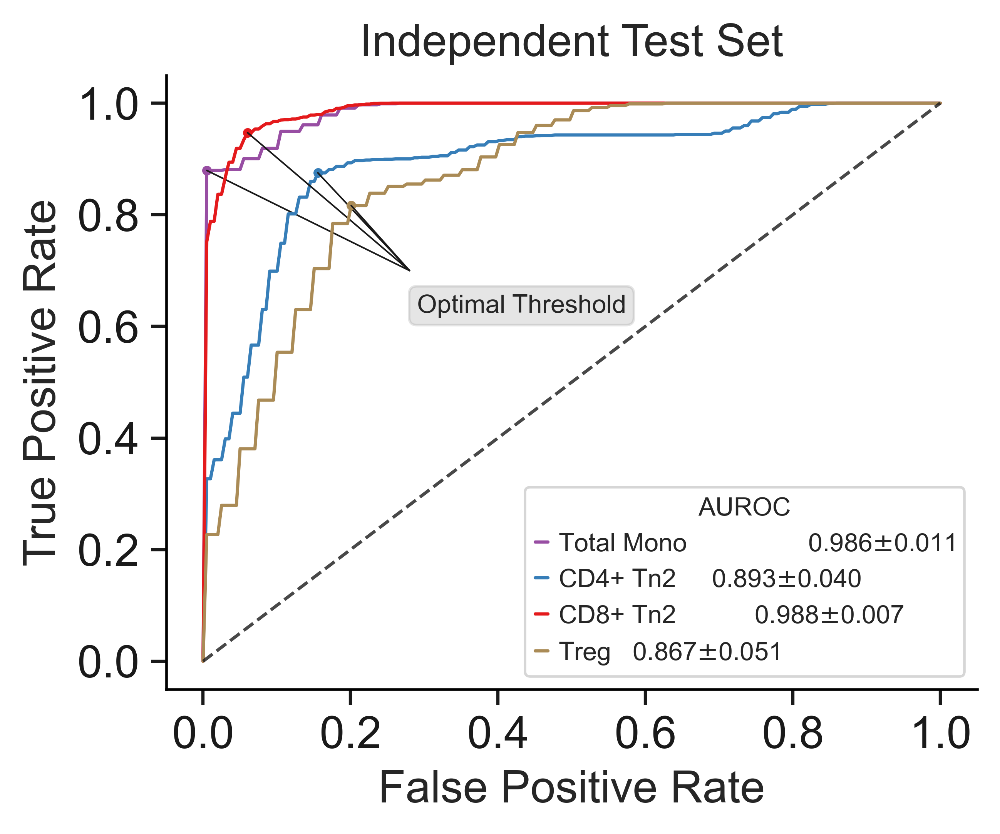

In [16]:
mean_fpr = np.linspace(0, 1, 200,endpoint=True)
import pickle
with open('pseudo5-final-results.pkl','rb') as f:
    res = pickle.load(f)
auc_dict = cal_roc_test(res,cell_types, mean_fpr)
plot_roc(cell_types, auc_dict, mean_fpr, clses,'Independent Test Set', save_path="plots/Fig_roc_test.pdf")

In [17]:
from sklearn.metrics import confusion_matrix

def plot_cm(res, kkey, title,save_fname):
    tn = []
    tp = []
    fn = []
    fp = []
    
    for i in range(len(res[kkey]['y_pred_prob'])):
        ii_pred_prob = np.array(res[kkey]['y_pred_prob'][i])
        ii_y_pred = np.where(ii_pred_prob<res[kkey]['opt_thre'], 0, 1) #
        _tn, _fp, _fn, _tp = confusion_matrix(np.array(res[kkey]['y_ture'][i]), ii_y_pred).ravel()
        tn.append(_tn)
        tp.append(_tp)
        fn.append(_fn)
        fp.append(_fp)
    cm_mean = np.array([[np.mean(tn), np.mean(fp)],
                        [np.mean(fn), np.mean(tp)]])
    
    helper.plot_confusion_matrix(cm_mean,
                          ['NP', 'PE'],
                          title=title,
                          cmap=plt.cm.Oranges,
                          normalize=True, save_fname=save_fname)
    
    

In [18]:
import umap

In [19]:
import sklearn
sklearn.__version__

'1.0.2'

In [20]:
from sklearn.decomposition import PCA
from sklearn.manifold import MDS,LocallyLinearEmbedding, TSNE, SpectralEmbedding
from sklearn.cluster import KMeans

def plot_umap(res, kkey, x, y, auc_dict, n_neighbors, min_dist,n_com, metric):
    # u = umap.UMAP(
    #     n_neighbors=n_neighbors,
    #     min_dist=min_dist,
    #     n_components=n_com,
    #     metric=metric,random_state=123
    # ).fit_transform(res[kkey][x])
    # u = PCA(n_components=2, random_state=0, svd_solver='arpack').fit_transform(res[kkey][x])
    # u = MDS(n_components=2,random_state=42).fit_transform(res[kkey][x])
    # u = LocallyLinearEmbedding(method="standard", n_neighbors=n_neighbors, n_components=n_com, eigen_solver="auto", random_state=0).fit_transform(res[kkey][x])
    # u = SpectralEmbedding(n_components=2, n_neighbors=n_neighbors).fit_transform(res[kkey][x])
    u = TSNE(n_components=n_com, perplexity=20.0,random_state=0,learning_rate=500,init='pca').fit_transform(res[kkey][x])
    
    x_min, x_max = np.min(u, axis=0), np.max(u, axis=0)
    u = (u - x_min) / (x_max - x_min)
    
    i_model = res[kkey]['best_model']
    opt_thre = auc_dict[kkey]['opt_thre']

    ii_y_predp = i_model.predict_proba(res[kkey][x])[:,1]
    ii_y_pred = np.where(ii_y_predp<opt_thre, 0, 1)
    
    y_series1 = pd.Series(res[kkey][y])
    y_series2 = pd.Series(ii_y_pred)
    
    mis_cls = res[kkey][y] != ii_y_pred
    
    fig = plt.figure(figsize=(6,3))
    y_symb1 = y_series1.map({0:'NP',1:'PE'})
    y_symb2 = y_series2.map({0:'NP',1:'PE'})
    palette = dict({'NP':'#278DC5','PE':'#E57E11'})
    if n_com == 2:
        ax1 = fig.add_subplot(121)
        sns.scatterplot(
            u[:, 0],
            u[:, 1],
            hue=y_symb1,
            palette=palette,legend='full',s=25, ax =ax1
            # edgecolor='w',
        )
        
        ax2 = fig.add_subplot(122)
        sns.scatterplot(
            u[:, 0],
            u[:, 1],
            hue=y_symb2,
            palette=palette,legend='full',s=25, ax =ax2
            # edgecolor='w',
        )
        
        ax2.scatter(
            u[mis_cls, 0],
            u[mis_cls, 1],
            marker='x',s=20,
            c='k',lw=1,
            # edgecolor='w'
        )
    # ax.grid(False)
    # ax.set_xticks([])
    # ax.set_yticks([])
    # ax.set_xlabel('UMAP 1')
    # ax.set_ylabel('UMAP 2')
    # ax.set_title(kkey)
    # if n_com == 3:
    #     ax.set_zticks([])
    #     ax.set_zlabel('UMAP 3')
    #     plt.gca().set_aspect('auto','datalim')
    if n_com == 2:
        plt.gca().set_aspect('equal', 'datalim')
    plt.legend(loc="best")



In [21]:
# plot_umap(res, cell_types[2], 'pd_X_tr', 'y_tr',20,0.001,2,'euclidean')
# plot_umap(res, cell_types[3], 'pd_X_tr', 'y_tr', 20,0.001,2, 'euclidean')
# plot_umap(res, cell_types[4], 'pd_X_tr', 'y_tr',auc_dict_train, 20, 0.001, 2, 'euclidean')
# plot_umap(res, cell_types[5], 'pd_X_tr', 'y_tr', 20, 0.001, 2, 'euclidean')

In [22]:
# plot_umap(res, cell_types[2], 'pd_X_te', 'y_te',20,0.001,2,'euclidean')
# plot_umap(res, cell_types[3], 'pd_X_te', 'y_te', 20,0.001,2, 'euclidean')
# plot_umap(res, cell_types[4], 'pd_X_te', 'y_te', 20, 0.001, 2, 'euclidean')
# plot_umap(res, cell_types[5], 'pd_X_te', 'y_te', 20, 0.001, 2, 'euclidean')

In [23]:
def cal_f1(res, cell_types, nb=5):

    f1_s = []
    cell_names=[]
    for k, kkey in enumerate(cell_types):
        cell_names.extend([clses[k]] * nb)
        for i in range(nb):
            ii_pred_prob = np.array(res[kkey]['y_pred_prob'][i])
            ii_y_pred = np.where(ii_pred_prob<res[kkey]['opt_thre'], 0, 1) #
            i_f1 = metrics.f1_score(np.array(res[kkey]['y_ture'][i]), ii_y_pred, average='weighted')
            f1_s.append(i_f1)
        

    df = pd.DataFrame(index=range(len(cell_names)))
    df['cell_type']=cell_names
    df['f1_score']=f1_s
        
    return df

In [24]:
f1_train = cal_f1(auc_dict_train, cell_types)

In [25]:
f1_test = cal_f1(auc_dict, cell_types, nb=100)

meta NOT subset; don't know how to subset; dropped


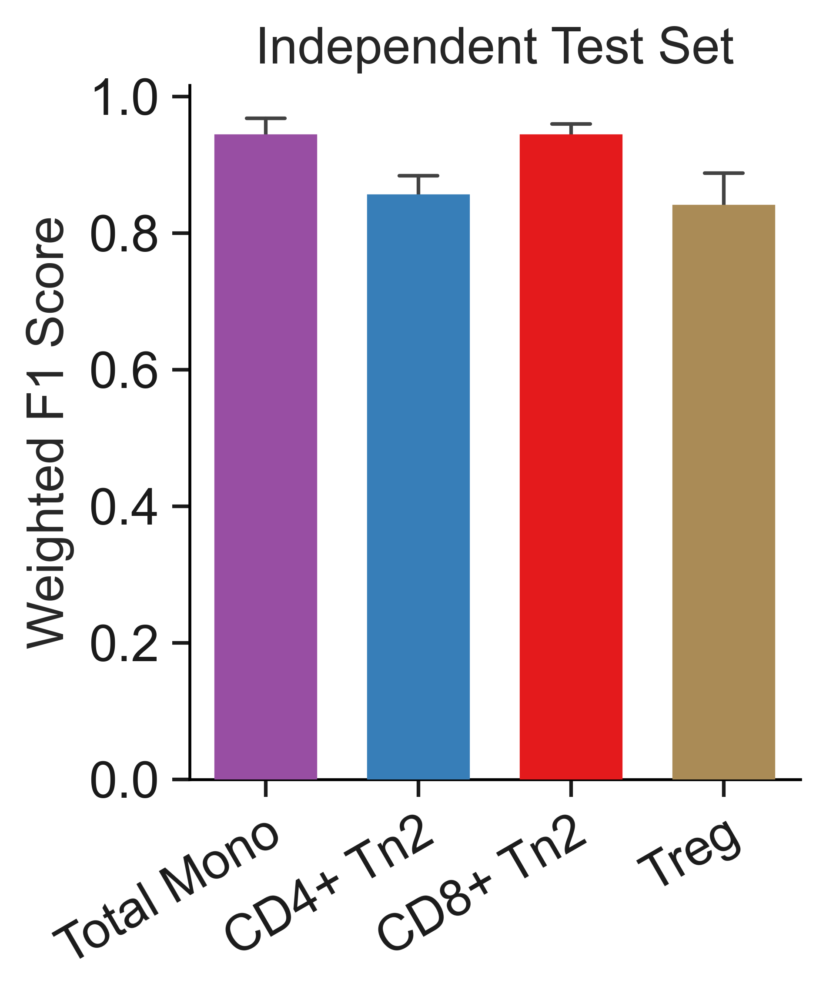

In [26]:
bar_plot(f1_test, y='f1_score', y_label='Weighted F1 Score', title='Independent Test Set', save_path="plots/Figure_S1_Test_F1.pdf")

In [27]:
f1_test.groupby('cell_type').agg(['mean', 'std'])

f1_score          
                mean       std
cell_type                     
CD4+ Tn2    0.854302  0.030092
CD8+ Tn2    0.941845  0.017937
Total Mono  0.942433  0.026113
Treg        0.839100  0.048967

meta NOT subset; don't know how to subset; dropped


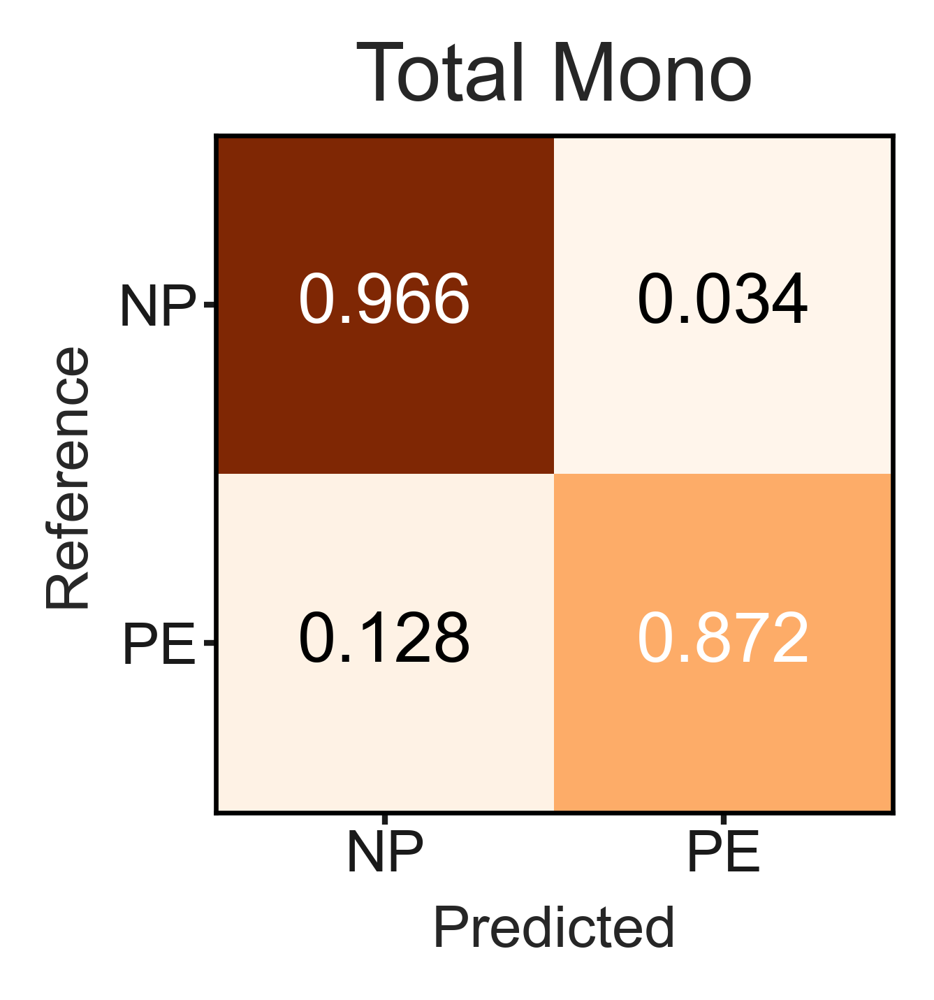

meta NOT subset; don't know how to subset; dropped


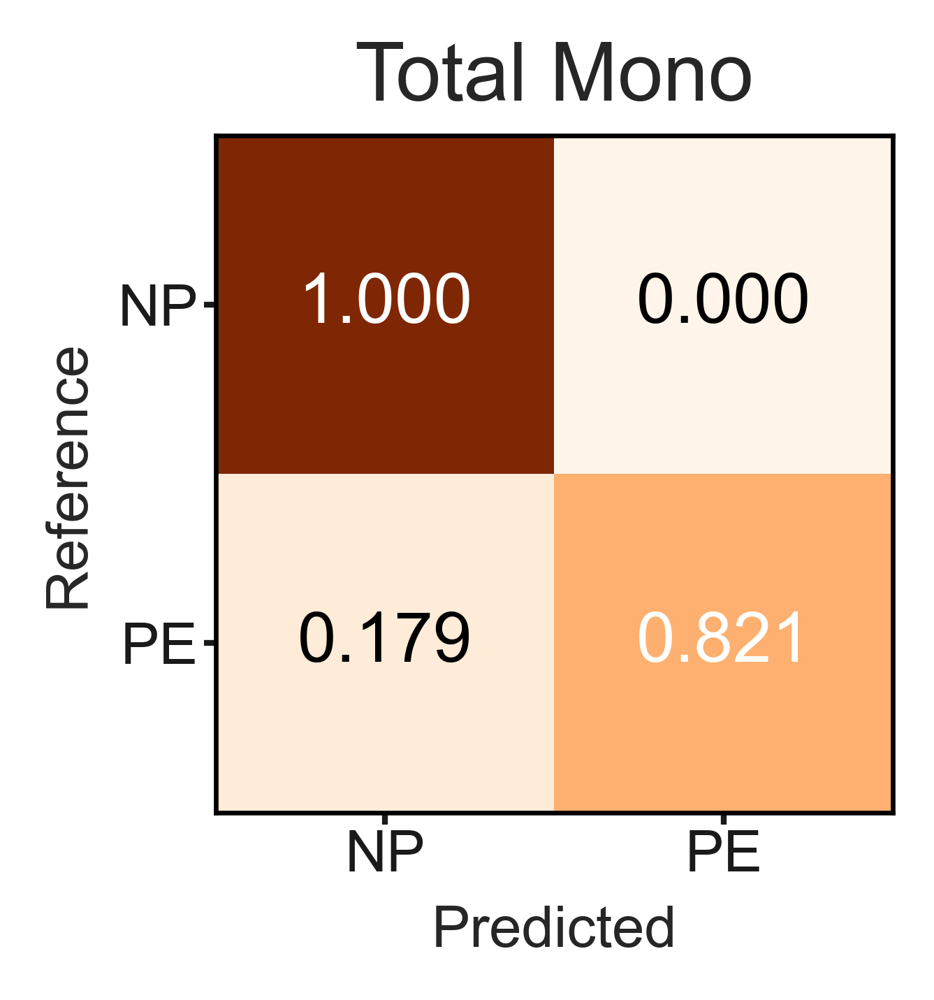

meta NOT subset; don't know how to subset; dropped


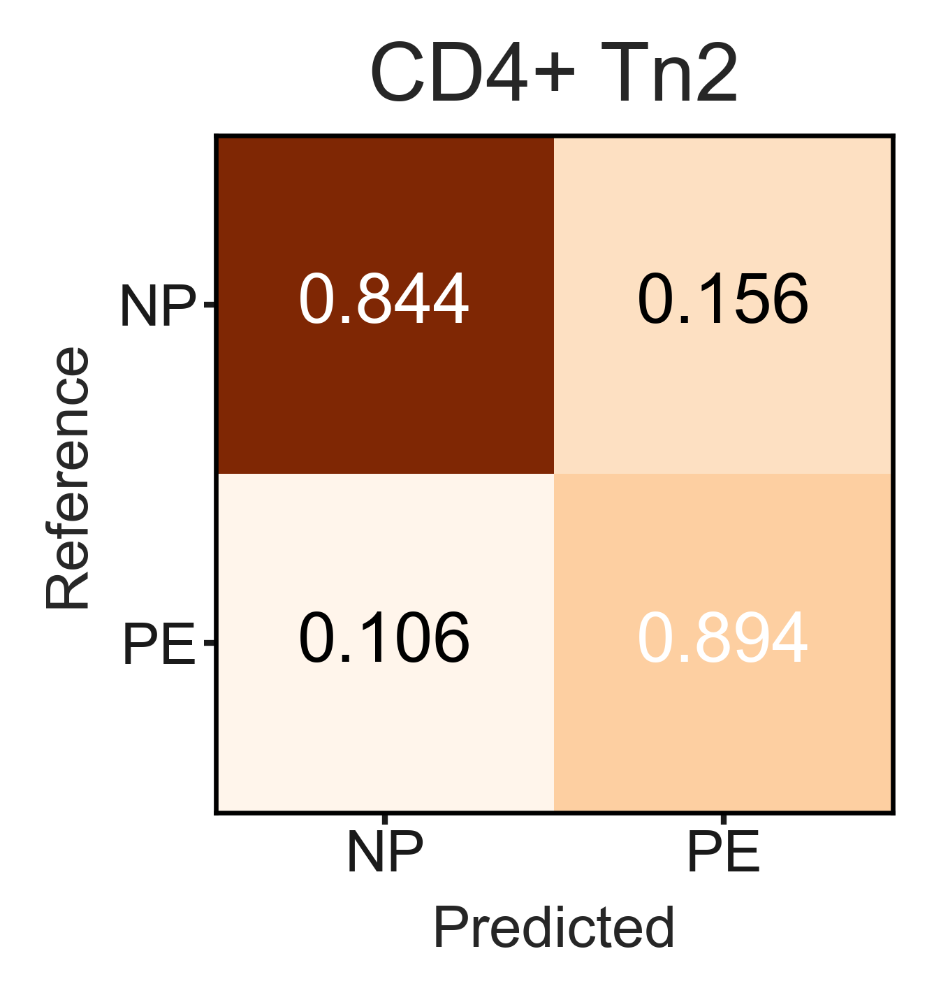

meta NOT subset; don't know how to subset; dropped


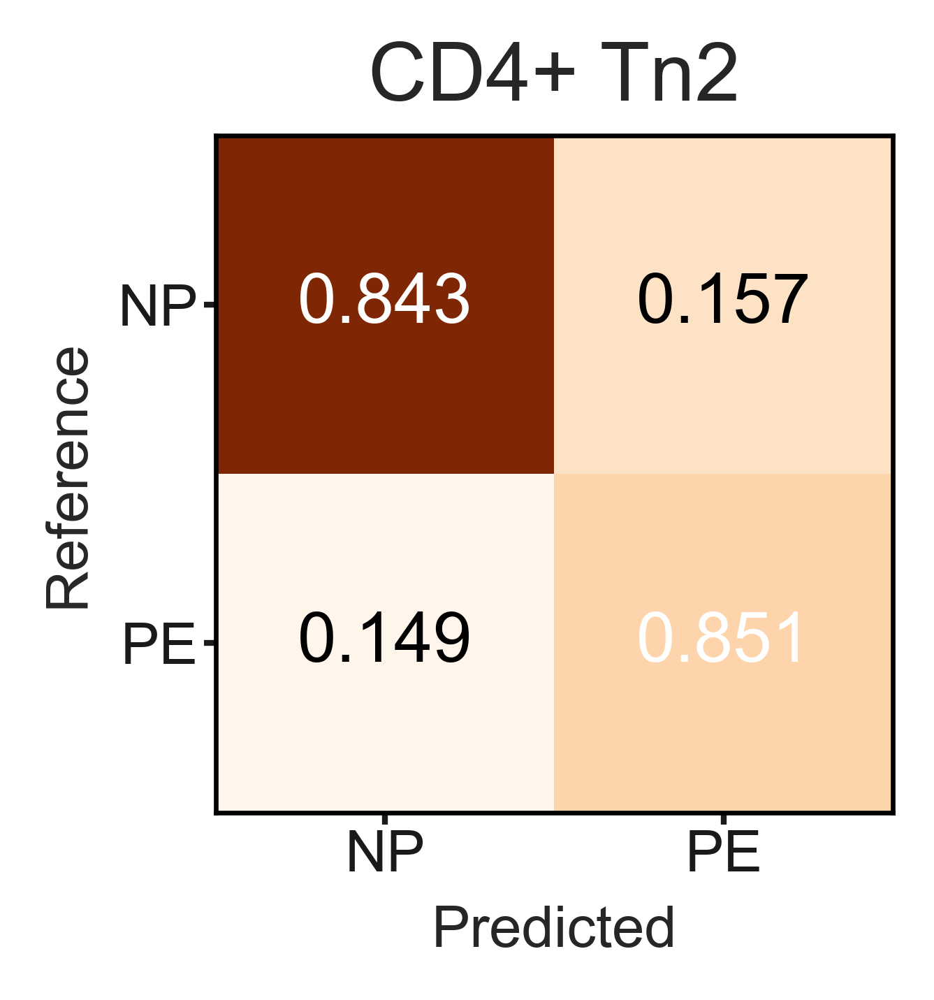

meta NOT subset; don't know how to subset; dropped


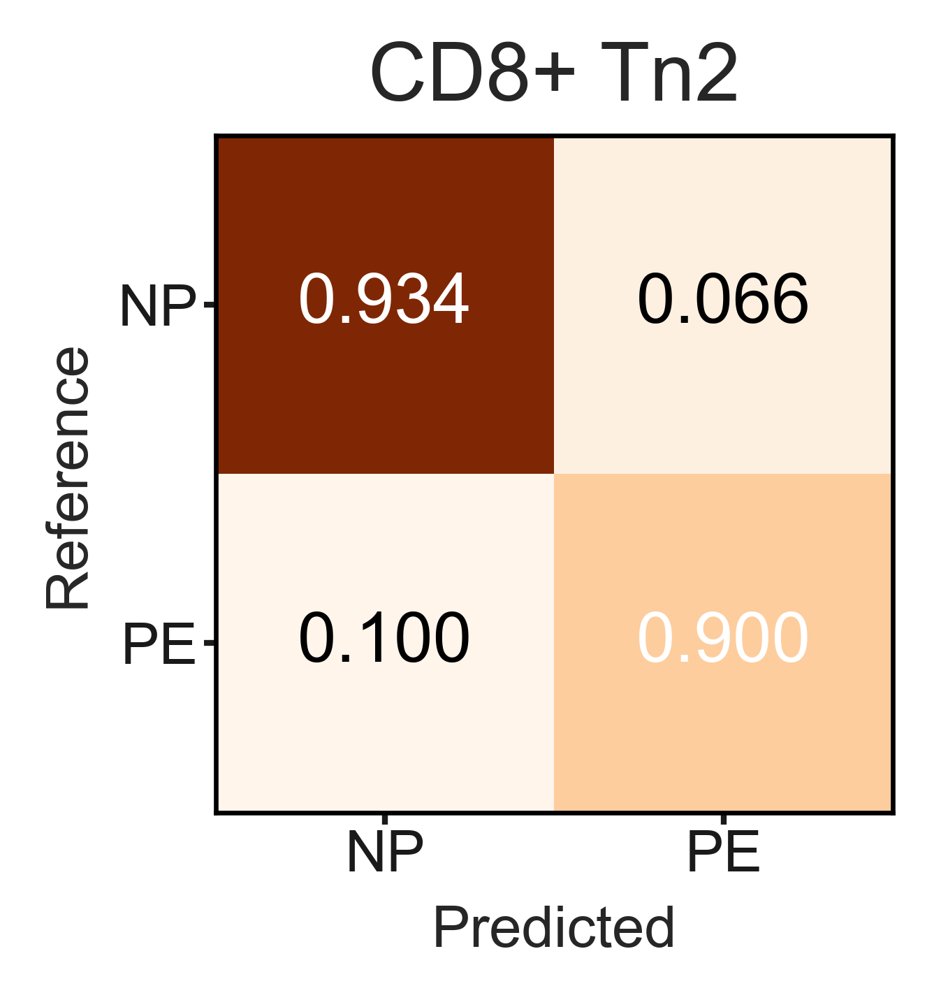

meta NOT subset; don't know how to subset; dropped


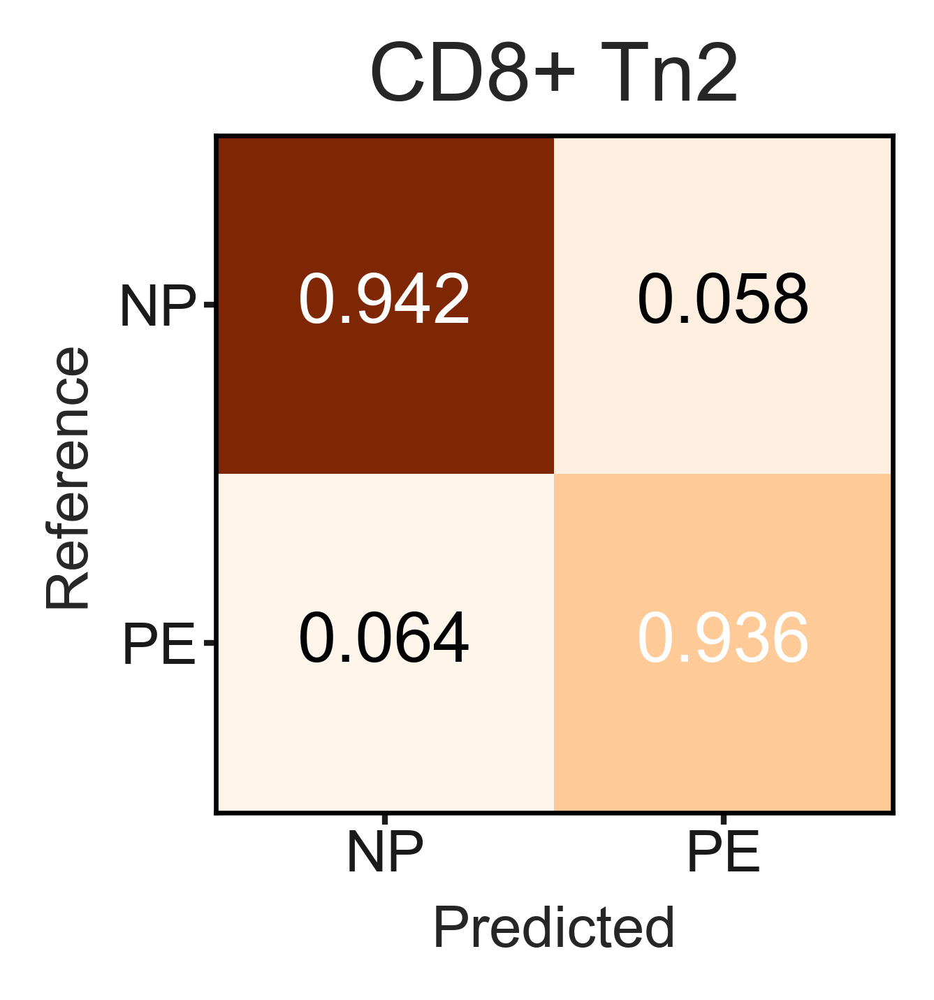

meta NOT subset; don't know how to subset; dropped


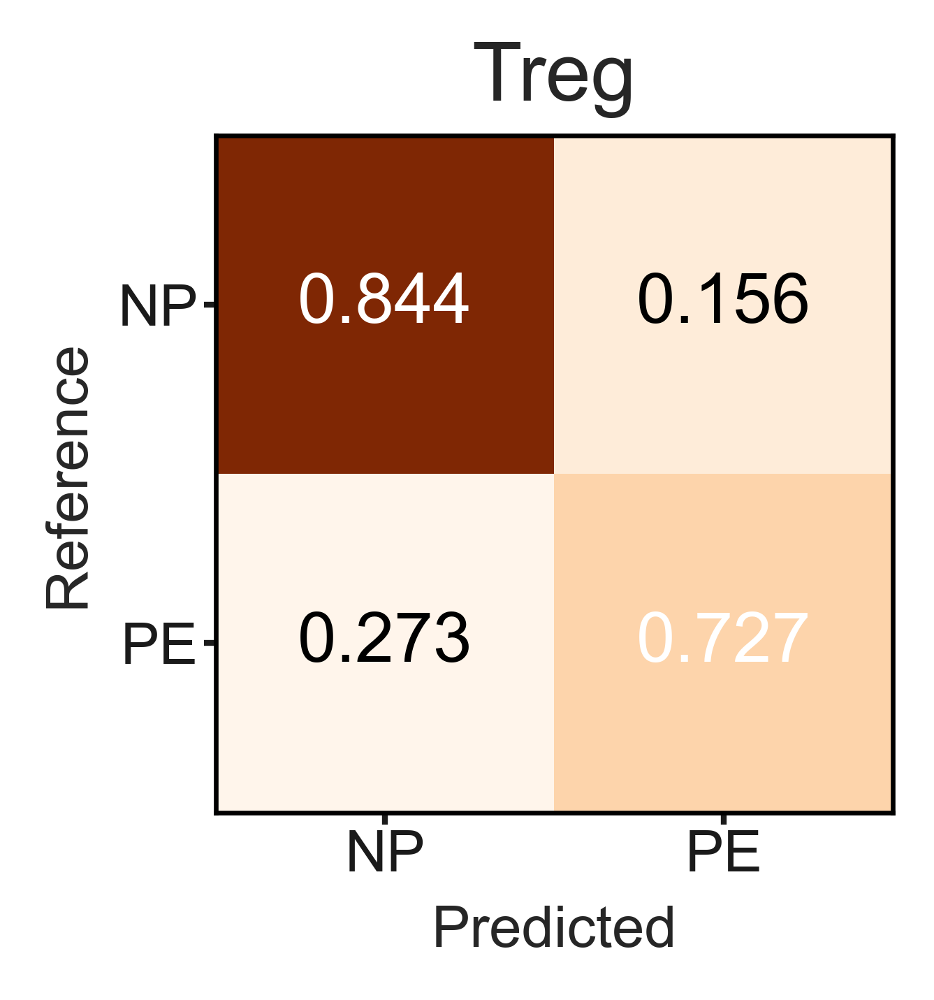

meta NOT subset; don't know how to subset; dropped


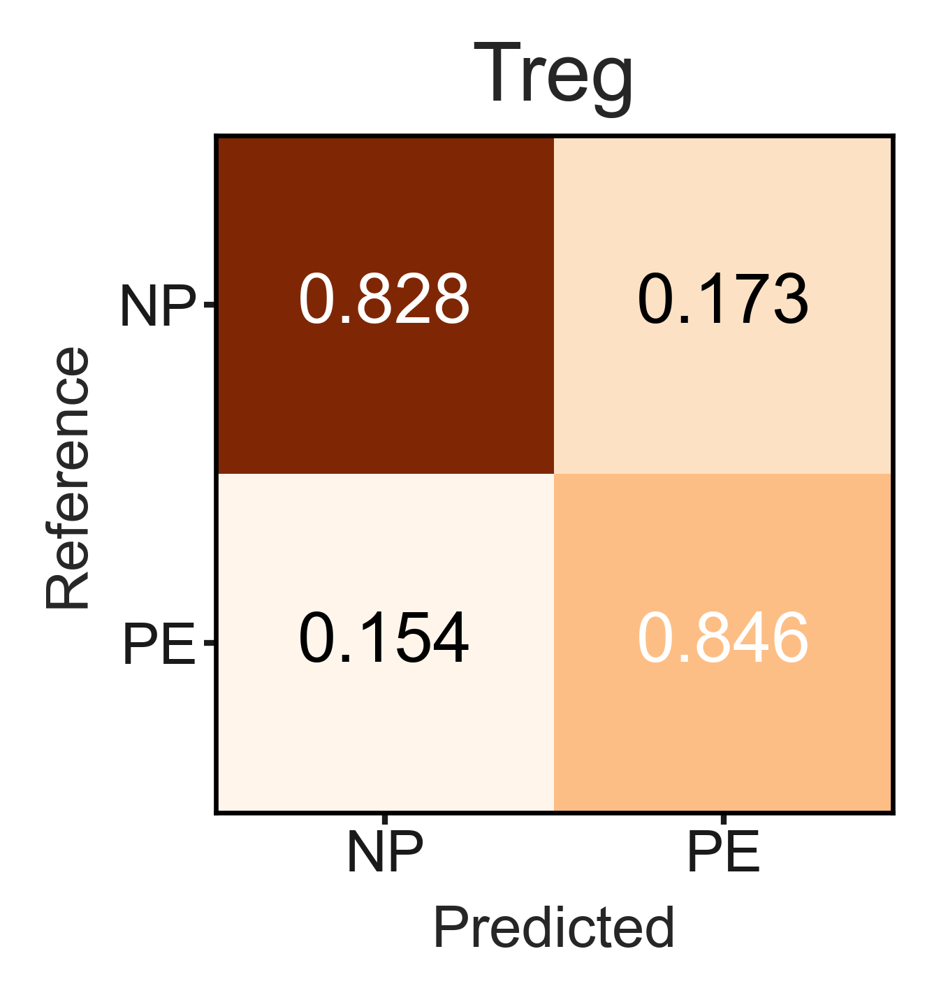

In [30]:
for i in range(len(cell_types)):
    plot_cm(auc_dict_train, cell_types[i], clses[i], "plots/train_CM_{0}.pdf".format(cell_types[i]))
    plot_cm(auc_dict, cell_types[i], clses[i], "plots/test_CM_{0}.pdf".format(cell_types[i]))

In [18]:
from sklearn import metrics
# from numpy.random import randint
# from numpy.random import seed
# seed(1)
from sklearn.utils import resample
# from sklearn.model_selection import LeavePOut

perm_val=dict()

perm_auc_val=dict()
c_type=[]
sen=[]
spe=[]
npv=[]
ppv=[]

cc_type=[]

for j,kkey in enumerate(res):
    i_x_test=res[kkey]['pd_X_te']
    i_y_test=res[kkey]['y_te']
    i_model=res[kkey]['best_model']
    
    i_len=len(i_y_test)
    
    sen_all=[]
    spe_all=[]
    npv_all=[]
    ppv_all=[]
    
    c_type.append(clses[j])
    
    for i in range(1,101):
        ii_x,ii_y=resample(i_x_test, i_y_test,n_samples=i_len, stratify=i_y_test, random_state=i+123)
        ii_y_predp = i_model.predict_proba(ii_x)[:,1]
        i_fpr, i_tpr, i_thre = metrics.roc_curve(ii_y, ii_y_predp)
        
        
        ii_y_pred = np.where(ii_y_predp<=auc_dict[kkey]['opt_thre'], 0, 1)
        
        tn, fp, fn, tp = metrics.confusion_matrix(ii_y, ii_y_pred).ravel()
#         print(tn, fp, fn, tp)
#         print(tp+fn,tn+fp, fn+tn,tp+fp)
        sen_all.append(tp/(tp+fn))
        spe_all.append(tn/(tn+fp))
        npv_all.append(tn/(fn+tn))
        ppv_all.append(tp/(tp+fp))
    
    avg_sen=np.array(sen_all).mean()
    std_sen=np.array(sen_all).std()
    
    avg_spe=np.array(spe_all).mean()
    std_spe=np.array(spe_all).std()
    
    avg_npv=np.array(npv_all).mean()
    std_npv=np.array(npv_all).std()
    
    avg_ppv=np.array(ppv_all).mean()
    std_ppv=np.array(ppv_all).std()
    
    sen.append(r'{0:.3f}$\pm${1:.3f}'.format(avg_sen, std_sen))
    spe.append(r'{0:.3f}$\pm${1:.3f}'.format(avg_spe, std_spe))
    npv.append(r'{0:.3f}$\pm${1:.3f}'.format(avg_npv, std_npv))
    ppv.append(r'{0:.3f}$\pm${1:.3f}'.format(avg_ppv, std_ppv))
perm_val['Type']=c_type    
perm_val['SEN']=sen
perm_val['SPE']=spe
perm_val['NPV']=npv
perm_val['PPV']=ppv


    

In [47]:
perm_f = pd.DataFrame(perm_val)
perm_f.to_csv('plots/pseudo5-final_perm.csv',index=False)

In [48]:
perm_f

,Type,SEN,SPE,NPV,PPV
0,B,0.924$\pm$0.048,0.906$\pm$0.028,0.972$\pm$0.017,0.779$\pm$0.054
1,T and NK,0.928$\pm$0.016,0.936$\pm$0.008,0.980$\pm$0.004,0.794$\pm$0.022
2,Mono,0.821$\pm$0.078,1.000$\pm$0.000,0.927$\pm$0.030,1.000$\pm$0.000
3,CD4+ TN2,0.851$\pm$0.079,0.843$\pm$0.040,0.957$\pm$0.022,0.587$\pm$0.063
4,CD8+ TN2,0.936$\pm$0.042,0.942$\pm$0.021,0.981$\pm$0.012,0.825$\pm$0.051
5,Treg,0.846$\pm$0.093,0.828$\pm$0.063,0.940$\pm$0.035,0.642$\pm$0.092


In [24]:
# cell_types = ['Total_B', 'Total_T_NK', 'Total_Mono', 'cd4_tn2', 'cd8_tn2','Treg']
# i = 2
# shap_vals = res[cell_types[i]]['shap_values']
# shap.summary_plot(shap_vals[1], res[cell_types[i]]['pd_X_te'],plot_type='bar', show=True)
# # Get the current figure and axes objects.
# # fig, ax = plt.gcf(), plt.gca()

# # # Make the modifications that you want. I wanted
# # # to resize the x-axis, but you can do anything that you'd like.
# # ax.set_xlabel('Feature Importance')
# # plt.savefig("plots/Fig_Feature_importance_top20_{}.pdf".format(kkey), dpi=400, bbox_inches='tight', pad_inches = 0.1)
    

In [36]:
# keyy = 'Total_T_NK'
def get_top_ff(kkeyy, res):
    shap_vals = res[kkeyy]['shap_values']
    abs_vals_mean = np.abs(shap_vals).mean(0)
    feats = res[kkeyy]['feat_list']
    # multipled by 2: because two classes
    feat_impt = pd.DataFrame(list(zip(feats, abs_vals_mean.mean(0) *2
                                     )), columns=['feat', 'feat_impt']) 
    feat_impt.sort_values(by=['feat_impt'], ascending=False,inplace=True)
    feat_impt.reset_index(drop=True,inplace=True)
    
    res[kkeyy]['feat_impt_ord']=feat_impt

In [37]:
for kkey in res.keys():
    get_top_ff(kkey, res)

In [38]:
res['Total_T_NK']['feat_impt_ord']

,feat,feat_impt
0,DUSP1,0.123246
1,FOS,0.086795
2,GNLY,0.072391
3,NKG7,0.067323
4,MALAT1,0.066131
...,...,...
124,SH2D1B,0.000745
125,HLA-DMB,0.000703
126,BANK1,0.000569
127,ELOBP2,0.000523


meta NOT subset; don't know how to subset; dropped


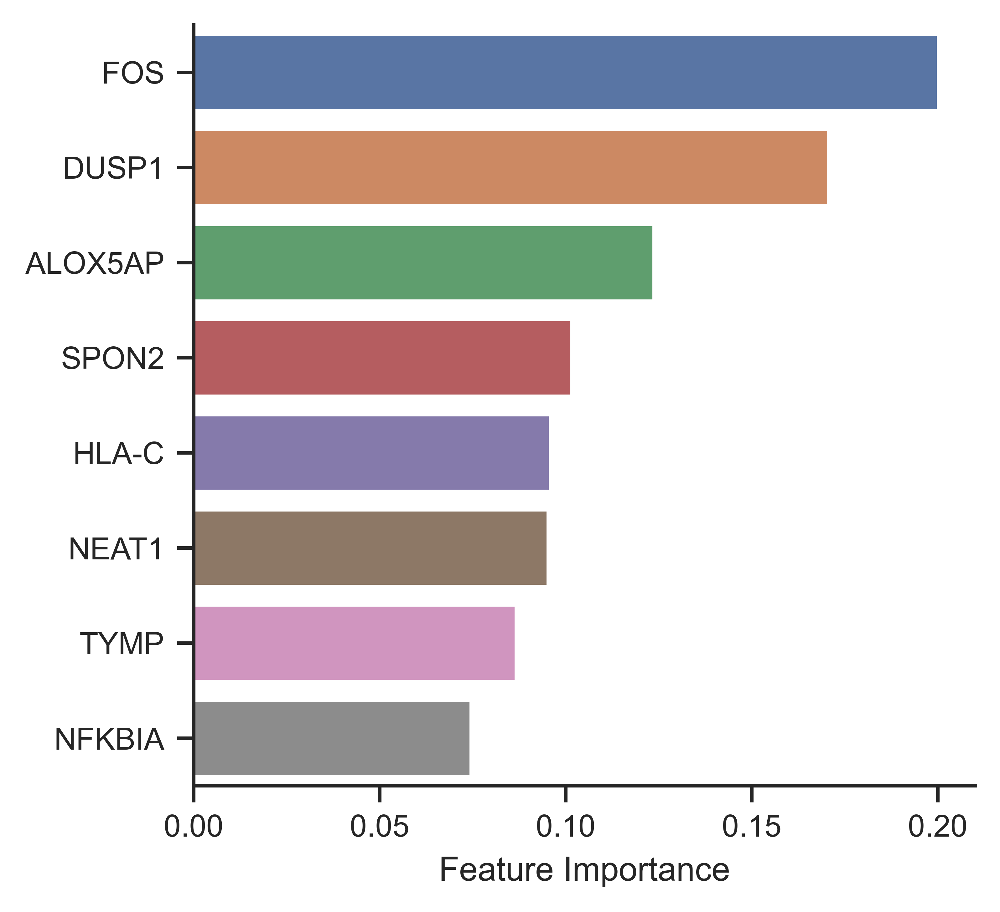

In [48]:
cell_types = ['Total_B', 'Total_T_NK', 'Total_Mono', 'cd4_tn2', 'cd8_tn2','Treg']
i = 5

xdf = res[cell_types[i]]['feat_impt_ord'].iloc[:20]

b = sns.barplot(data=xdf, x="feat_impt", y="feat", orient='h')
sns.despine()
plt.xlabel('Feature Importance')
plt.ylabel('')
plt.savefig("plots/Fig_Feature_importance_top20_{}.pdf".format(cell_types[i]), dpi=400, bbox_inches='tight', pad_inches = 0.1)

In [186]:
gene_l = {}
for kkey in res.keys():
    print('{}:{}'.format(kkey, res[kkey]['feat_impt_ord'].shape[0]))
    gene_l[kkey] = res[kkey]['feat_impt_ord']['feat'].values.tolist()

with open('f_gene.json','w') as fp:
    json.dump(gene_l,fp)

Total_B:27
Total_T_NK:129
Total_Mono:28
cd4_tn2:19
cd8_tn2:35
Treg:8


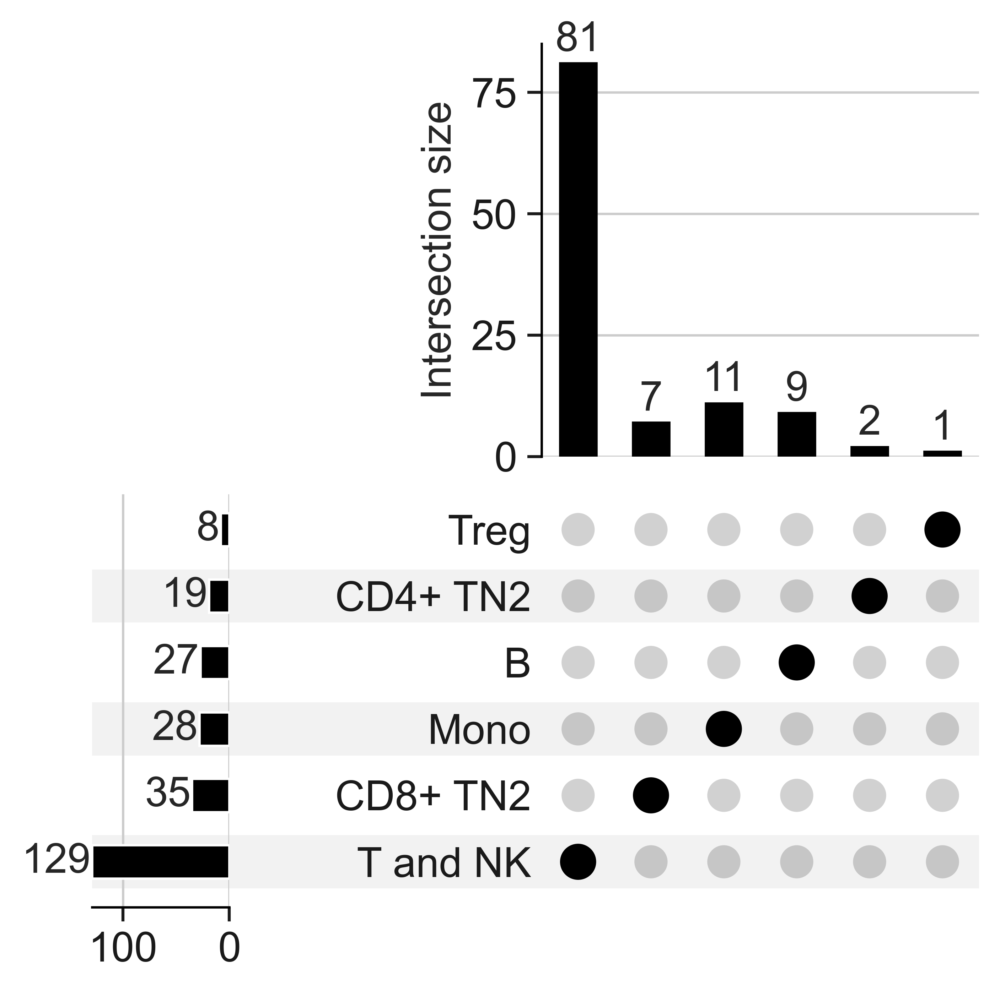

In [53]:
import upsetplot
feat_dicts=dict()
for i,kkey in enumerate(res):
    feat_dicts[clses[i]]=res[kkey]['feat_list']
upset_data_sub = upsetplot.from_contents(feat_dicts)
upsetplot.plot(upset_data_sub,show_counts=True,max_degree=1)
plt.savefig("plots/Fig_gene_intersection.pdf", dpi=400, bbox_inches='tight', format='pdf')

In [207]:
all_feats = upset_data_sub.reset_index()

gene_ll = dict()
for kkey in clses:
#     kkey='CD8+ Tn 1'
    tt = all_feats[all_feats[kkey]==True]
    
    n = [x for x in all_keys if x != kkey]
    xx = tt[tt[n].eq(False,axis=0).all(1)]['id'].values.tolist()
    # yy = tt[tt[n].eq(True,axis=0).all(1)]['id'].values.tolist()
    gene_ll[kkey]=xx

# upset_data_sub2 = upsetplot.from_contents(gene_ll)
# upsetplot.plot(upset_data_sub2,show_counts=True)
# plt.savefig("plots/Fig_gene_intersection.jpg", dpi=400, bbox_inches='tight', format='jpg')
## =============== read json
with open('celltpe_specific_gene.json','w') as fp:
    json.dump(gene_l,fp)
    


In [198]:
adata_prep = sc.read_h5ad(r'E:\pbmc_pe\data\Matrix\win_sc_data_preprocessed.h5ad')

In [199]:
adata_prep

AnnData object with n_obs × n_vars = 28733 × 2000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'group', 'percent.ercc', 'percent.rp', 'percent.mt', 'percent.ncRNA', 'percent.LOC', 'percent.HB', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.3', 'seurat_clusters', 'celltype_l1', 'celltype_l2', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'Total_B', 'Total_T_NK', 'Total_Mono', 'cd4_tn2', 'cd8_tn2', 'Treg'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'log1p'

In [245]:
!pip install statannotations

In [274]:
from statannotations.Annotator import Annotator
from scipy.stats import mannwhitneyu

centimeter = 1/2.54  # centimeter in inches
cell_types = ['Total_B', 'Total_T_NK', 'Total_Mono', 'cd4_tn2', 'cd8_tn2','Treg']
clses = ['B', 'T and NK', 'Mono', 'CD4+ TN2', 'CD8+ TN2', 'Treg']
cls_color = ['#ff7f00','#4daf4a','#984ea3','#377eb8', '#e41a1c','#AA8B56']

orders = ['NP','PE']
palette = dict(zip(orders, ['#2ecc71','#e74c3c']))

idx =1
cell_type = cell_types[idx]
final_f = gene_ll[clses[idx]]
t_adata = adata_prep[adata_prep.obs[cell_type], final_f].copy()
sc.pp.scale(t_adata)

x_data = t_adata.to_df().copy()
# x_data = x_data.apply(zscore)
x_data['label'] = t_adata.obs['group']
n_feat = len(final_f)
plot_col_n = 5
fig, axs = plt.subplots(int(np.ceil(n_feat/plot_col_n)),plot_col_n,
                        figsize=(18*centimeter,5.5*int(np.ceil(n_feat/plot_col_n))*centimeter))
axs = axs.ravel()
for j, i_feat in enumerate(final_f): 
    plot_param={
        'data':x_data,
        'x':'label',
        'y':i_feat,
        'order':orders,
    }

    # sns.stripplot(**plot_param, ax=axs[j],palette=palette,size=1.5)
    axa = sns.violinplot(**plot_param,ax=axs[j],palette=palette, showfliers=False, linewidth=0.5,width=0.6)
    
#     for i,artist in enumerate(axs[j].artists):
#         # Set the linecolor on the artist to the facecolor, and set the facecolor to None
#         col = artist.get_facecolor()
#         artist.set_edgecolor(col)
#         artist.set_facecolor('None')

#         # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
#         # Loop over them here, and use the same colour as above
#         for j in range(i*5,i*5+5):
#             line = axa.lines[j]
#             line.set_color(col)
#             line.set_mfc(col)
#             line.set_mec(col)
    
    np_vals = x_data.loc[x_data['label']=='NP',
                                  i_feat].values
    pe_vals = x_data.loc[x_data['label']=='PE',
                               i_feat].values

    pvalues=[mannwhitneyu(np_vals, pe_vals, alternative="two-sided").pvalue]

    formatted_pvalues = [f"p={p:.2e}" for p in pvalues]

    anno_pairs= [(orders[0], orders[1])]
    annot = Annotator(axa, pairs=anno_pairs, **plot_param)
    
    annot.set_pvalues(pvalues)
    # annot.reset_configuration()
    # annot.set_custom_annotations(formatted_pvalues)
    annot.configure(verbose=False,line_width=1,fontsize=8,loc='outside',line_height=0, text_offset=1)
    annot.annotate()
    
    axa.set_xlabel(None)
    axa.set_ylabel(i_feat)
    axa.set_xticks([])
    # axa.set_title(i_feat)
    axa.tick_params(direction='out', length=2, pad=1, width=1)

    # axa.set_xticklabels(axa.get_xticklabels(),rotation=30, ha='right')
    sns.despine()
    axa.grid(False)
plt.tight_layout()

plt.savefig("plots/Fig_gene_expr_{}.jpg".format(cell_type), dpi=400, bbox_inches='tight', format='jpg')

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


Annotator was reconfigured without applying the test (again) which will probably lead to unexpected results
Annotator was reconfigured without applying the test (again) which will probably lead to unexpected results
Annotator was reconfigured without applying the test (again) which will probably lead to unexpected results
Annotator was reconfigured without applying the test (again) which will probably lead to unexpected results
Annotator was reconfigured without applying the test (again) which will probably lead to unexpected results
Annotator was reconfigured without applying the test (again) which will probably lead to unexpected results
Annotator was reconfigured without applying the test (again) which will probably lead to unexpected results
Annotator was reconfigured without applying the test (again) which will probably lead to unexpected results
Annotator was reconfigured without applying the test (again) which will probably lead to unexpected results
Annotator was reconfigured w

In [268]:
x_data.max()

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.


FCRL1      2.823234
CD8A       6.500359
MAL        5.499845
GZMK       7.944108
CD83       3.215235
SYTL3      7.465209
TSPAN13    5.827785
MAP3K8     3.371705
RUBCNL     3.888033
dtype: float32

In [196]:
cell_type

'Total_B'

In [54]:
# final_f=res[cell_type]['feat_impt_ord'].iloc[:50]['feat'].values
from itertools import groupby

# https://github.com/brettChapman/multivis/blob/master/multivis/clustermap.py

def plot_heatmap(cell_type,res, final_f, figs_size,fontsize=6):
    
    trn_data = res[cell_type]['pd_X_tr'][final_f].copy()
    y_trn = res[cell_type]['y_tr'].tolist()
    tes_data = res[cell_type]['pd_X_te'][final_f].copy()
    y_tet = res[cell_type]['y_te'].tolist()

    y = np.array(y_trn+y_tet)

    y_sorted = np.sort(y)
    sort_idx = np.argsort(y)

    x_df = pd.concat([trn_data, trn_data], ignore_index=True).iloc[sort_idx,:]
    x_df.reset_index(drop=True,inplace=True)


    lal={0:'NP',1:'PE'}
    p_group =  [lal[k] for k in y_sorted]

    uniq_group = np.unique(p_group)

    lut = dict(zip(uniq_group, ["#5cb85c", "#d9534f"]))
    # col_colors = [lut[k] for k in p_group]
    col_colors = [lut[k] for k in p_group]

    # fig_h=int(0.08*len(final_f)+1)

    g = sns.clustermap(x_df.T,col_colors=col_colors,cmap=plt.get_cmap("coolwarm"),
                   z_score=0,dendrogram_ratio=0.06,
                   center=0.0,row_cluster=True, col_cluster=False,
                   metric="correlation", method='complete',vmin = -6, vmax=6,
                   figsize=figs_size, xticklabels=False, yticklabels=True,
                  cbar_pos=(0.9, .4, .015, .25))
    g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_ymajorticklabels(), fontsize = fontsize)
    g.ax_heatmap.yaxis.set_tick_params(size=2,width=0.5) 

    x_pos = np.sum(np.array(p_group) == uniq_group[0])
    g.ax_heatmap.axvline(x_pos,color='k',linestyle='-', linewidth=0.5)

    g.ax_cbar.set_title('Expr.\n (Z-score)', fontsize=6)
    g.ax_cbar.set_yticklabels(g.ax_cbar.get_ymajorticklabels(), fontsize = 6)
    g.ax_cbar.yaxis.set_tick_params(size=2,width=0.5) 

    # get cluster
    # from scipy.cluster.hierarchy import dendrogram, linkage
    # dn = dendrogram(g.dendrogram_row.linkage)
    # then cluster labels and original feature index can be obtained by dn
    # 
    # eg., obtain row dendrogram: 
    # g.ax_row_dendrogram.get_position().width
    # eg., obtain color bar
    # g.ax_cbar.set_position([])
    # g.ax_cbar.set_title('Expr.')
    # g.ax_cbar.tick_params(axis='x', length=10)

    # plot h line
    # the number 5 refers to the 5th row
    # g.ax_heatmap.axhline(5,color='k',linestyle='-')
    #
    # obtain all attributes of g
    # dir(g)

    # http://dawnmy.github.io/2016/10/24/Plot-heatmaap-with-side-color-indicating-the-class-of-variables/
    # 
    # for label in uniq_group:
    #     g.ax_col_dendrogram.bar(0, 0, color=lut[label],
    #                         label=label, linewidth=0)
    # g.ax_col_dendrogram.legend(loc="center", ncol=5)

    #
    # https://stackoverflow.com/questions/71373622/how-to-add-labels-to-the-side-color-bar-in-clustermap-in-seaborn-python
    borders = np.cumsum([0] + [sum(1 for i in g) for k, g in groupby(col_colors)])
    # labels=['pseudo single cell from NP', 'pseudo single cell from PE']

    for b0, b1, label in zip(borders[:-1], borders[1:], uniq_group):
        g.ax_col_colors.text((b0 + b1) / 2, 1.1, label, color='black', ha='center', va='bottom',
                     transform=g.ax_col_colors.get_xaxis_transform(),fontsize=6)
    
    hm = g.ax_heatmap.get_position()
    wspace = 0.0025
    colorBar_thickness = 0.02
    g.ax_col_colors.set_position([hm.x0, hm.y1 + wspace, hm.width, colorBar_thickness])

    # g.ax_col_colors.set_yticklabels('')
    # g.ax_col_colors.yaxis.set_tick_params(size=0) 

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
FixedFormatter should only be used together with FixedLocator


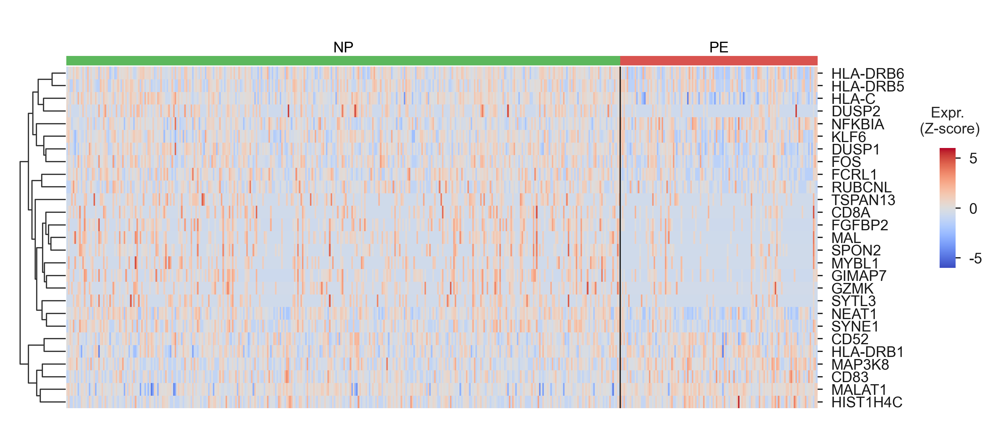

In [55]:
cell_types = ['Total_B', 'Total_T_NK', 'Total_Mono', 'cd4_tn2', 'cd8_tn2','Treg']
cell_type = cell_types[0]
final_f=res[cell_type]['feat_impt_ord']['feat'].values
figs_size=(6, 0.1*len(final_f))
plot_heatmap(cell_type, res, final_f, figs_size)
plt.savefig("plots/Fig_heatmap_{}.jpg".format(cell_type), dpi=400, bbox_inches='tight', pad_inches = 0.1)

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
FixedFormatter should only be used together with FixedLocator


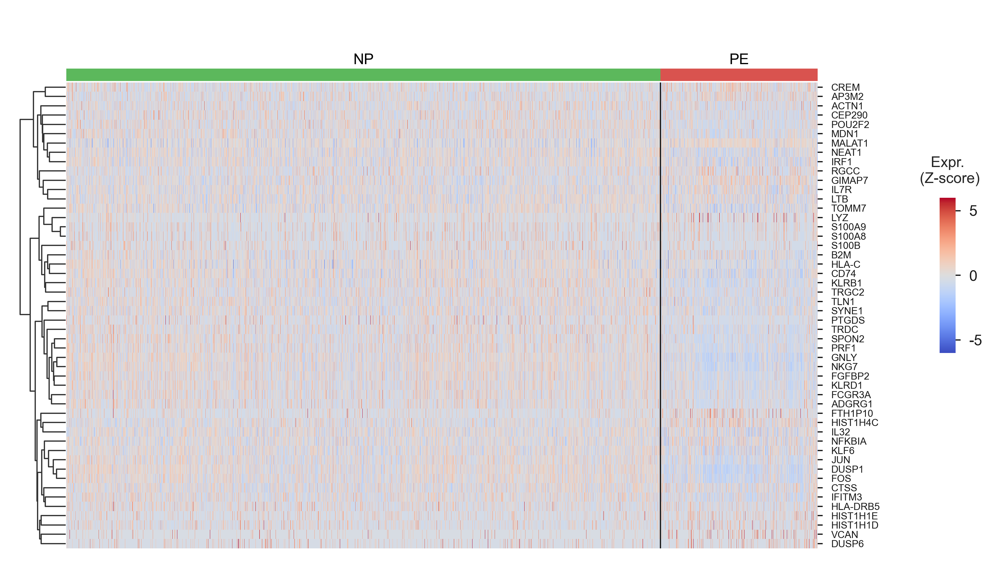

In [56]:
cell_types = ['Total_B', 'Total_T_NK', 'Total_Mono', 'cd4_tn2', 'cd8_tn2','Treg']
cell_type = cell_types[1]
final_f=res[cell_type]['feat_impt_ord']['feat'].values[:50]
figs_size=(6, 0.07*len(final_f))
fontsize=4
plot_heatmap(cell_type, res, final_f, figs_size, fontsize=fontsize)
plt.savefig("plots/Fig_heatmap_{}_top50.jpg".format(cell_type), dpi=400, bbox_inches='tight', pad_inches = 0.1)

FixedFormatter should only be used together with FixedLocator


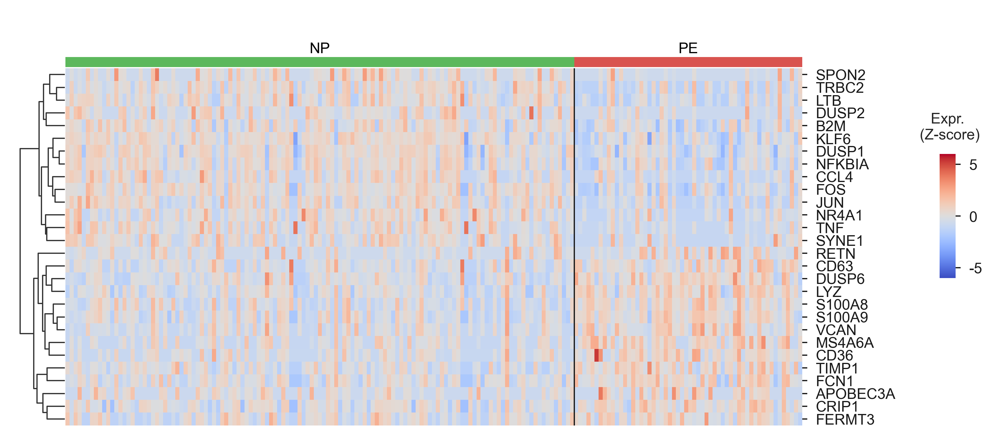

In [57]:
cell_types = ['Total_B', 'Total_T_NK', 'Total_Mono', 'cd4_tn2', 'cd8_tn2','Treg']
cell_type = cell_types[2]
final_f=res[cell_type]['feat_impt_ord']['feat'].values[:50]
figs_size=(6, 0.1*len(final_f))
fontsize=6
plot_heatmap(cell_type, res, final_f, figs_size, fontsize=fontsize)
plt.savefig("plots/Fig_heatmap_{}.jpg".format(cell_type), dpi=400, bbox_inches='tight', pad_inches = 0.1)

FixedFormatter should only be used together with FixedLocator


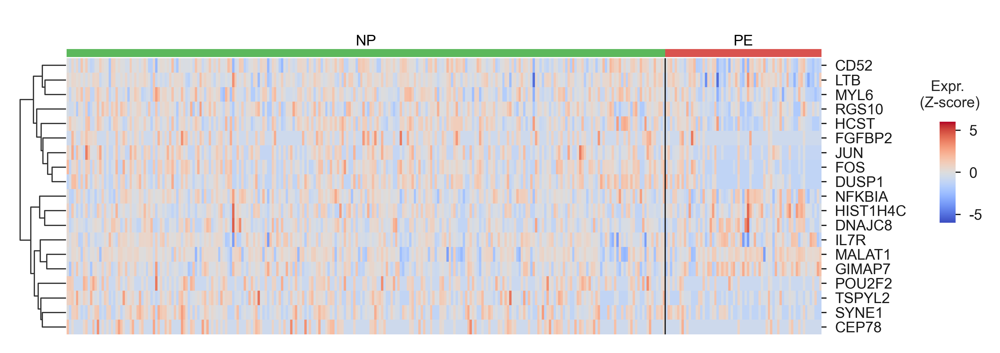

In [58]:
cell_types = ['Total_B', 'Total_T_NK', 'Total_Mono', 'cd4_tn2', 'cd8_tn2','Treg']
cell_type = cell_types[3]
final_f=res[cell_type]['feat_impt_ord']['feat'].values[:50]
figs_size=(6, 0.12*len(final_f))
fontsize=6
plot_heatmap(cell_type, res, final_f, figs_size, fontsize=fontsize)
plt.savefig("plots/Fig_heatmap_{}.jpg".format(cell_type), dpi=400, bbox_inches='tight', pad_inches = 0.1)

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
FixedFormatter should only be used together with FixedLocator


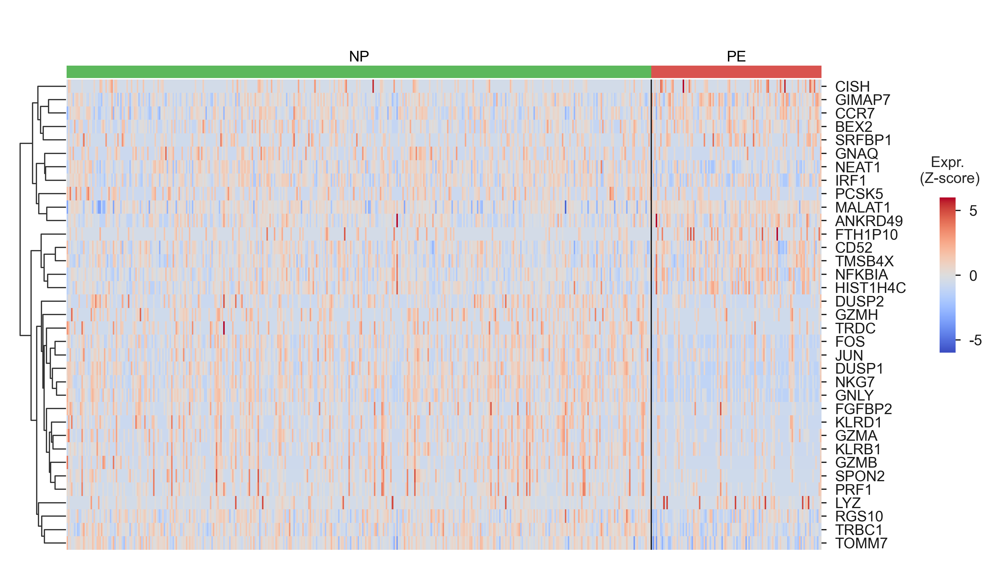

In [59]:
cell_types = ['Total_B', 'Total_T_NK', 'Total_Mono', 'cd4_tn2', 'cd8_tn2','Treg']
cell_type = cell_types[4]
final_f=res[cell_type]['feat_impt_ord']['feat'].values[:50]
figs_size=(6, 0.1*len(final_f))
fontsize=6
plot_heatmap(cell_type, res, final_f, figs_size, fontsize=fontsize)
plt.savefig("plots/Fig_heatmap_{}.jpg".format(cell_type), dpi=400, bbox_inches='tight', pad_inches = 0.1)

FixedFormatter should only be used together with FixedLocator


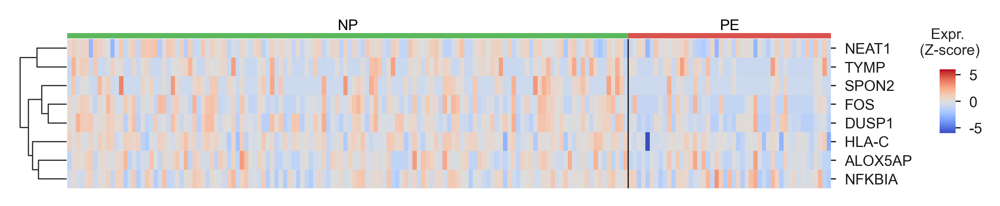

In [60]:
cell_types = ['Total_B', 'Total_T_NK', 'Total_Mono', 'cd4_tn2', 'cd8_tn2','Treg']
cell_type = cell_types[5]
final_f=res[cell_type]['feat_impt_ord']['feat'].values[:50]
figs_size=(6, 0.18*len(final_f))
fontsize=6
plot_heatmap(cell_type, res, final_f, figs_size, fontsize=fontsize)
plt.savefig("plots/Fig_heatmap_{}.jpg".format(cell_type), dpi=400, bbox_inches='tight', pad_inches = 0.1)

In [179]:
# cell_type = 'Treg'
from itertools import groupby

def plot_clustermap(cell_type, res, adata_prep, final_f, figs_size, fontsize=6):
    # final_f=res[cell_type]['feat_impt_ord'].iloc[:50]['feat'].values
    # final_f = res[cell_type]['feat_list']
    t_adata = adata_prep[adata_prep.obs[cell_type], final_f].copy()
    
    # here p_group has been ordered , e.g., first NP then PE
    p_group = t_adata.obs['group'].values
    x_df = t_adata.to_df()
    
    uniq_group = np.unique(p_group)

    uniq_group = np.unique(p_group)

    lut = dict(zip(uniq_group, ["#5cb85c", "#d9534f"]))
    # col_colors = [lut[k] for k in p_group]
    col_colors = [lut[k] for k in p_group]

    # fig_h=int(0.08*len(final_f)+1)

    g = sns.clustermap(x_df.T,col_colors=col_colors,cmap=plt.get_cmap("coolwarm"),
                   z_score=0,dendrogram_ratio=0.02,
                   center=0.0,row_cluster=True, col_cluster=False,
                   metric="correlation", method='complete',vmin = -6, vmax=6,
                   figsize=figs_size, xticklabels=False, yticklabels=True,
                  cbar_pos=(0.9, .4, .015, .25))
    g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_ymajorticklabels(), fontsize = fontsize)
    g.ax_heatmap.yaxis.set_tick_params(size=2,width=0.5) 

    x_pos = np.sum(np.array(p_group) == uniq_group[0])
    g.ax_heatmap.axvline(x_pos,color='k',linestyle='-', linewidth=0.5)

    g.ax_cbar.set_title('Expr.\n (Z-score)', fontsize=6)
    g.ax_cbar.set_yticklabels(g.ax_cbar.get_ymajorticklabels(), fontsize = 6)
    g.ax_cbar.yaxis.set_tick_params(size=2,width=0.5) 

    # get cluster
    # from scipy.cluster.hierarchy import dendrogram, linkage
    # dn = dendrogram(g.dendrogram_row.linkage)
    # then cluster labels and original feature index can be obtained by dn
    # 
    # eg., obtain row dendrogram: 
    # g.ax_row_dendrogram.get_position().width
    # eg., obtain color bar
    # g.ax_cbar.set_position([])
    # g.ax_cbar.set_title('Expr.')
    # g.ax_cbar.tick_params(axis='x', length=10)

    # plot h line
    # the number 5 refers to the 5th row
    # g.ax_heatmap.axhline(5,color='k',linestyle='-')
    #
    # obtain all attributes of g
    # dir(g)

    # http://dawnmy.github.io/2016/10/24/Plot-heatmaap-with-side-color-indicating-the-class-of-variables/
    # 
    # for label in uniq_group:
    #     g.ax_col_dendrogram.bar(0, 0, color=lut[label],
    #                         label=label, linewidth=0)
    # g.ax_col_dendrogram.legend(loc="center", ncol=5)

    #
    # https://stackoverflow.com/questions/71373622/how-to-add-labels-to-the-side-color-bar-in-clustermap-in-seaborn-python
    borders = np.cumsum([0] + [sum(1 for i in g) for k, g in groupby(col_colors)])
    # labels=['pseudo single cell from NP', 'pseudo single cell from PE']

    for b0, b1, label in zip(borders[:-1], borders[1:], uniq_group):
        g.ax_col_colors.text((b0 + b1) / 2, 1.1, label, color='black', ha='center', va='bottom',
                     transform=g.ax_col_colors.get_xaxis_transform(),fontsize=6)
    
    hm = g.ax_heatmap.get_position()
    wspace = 0.003
    colorBar_thickness = 0.035
    g.ax_col_colors.set_position([hm.x0, hm.y1 + wspace, hm.width, colorBar_thickness])

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
FixedFormatter should only be used together with FixedLocator


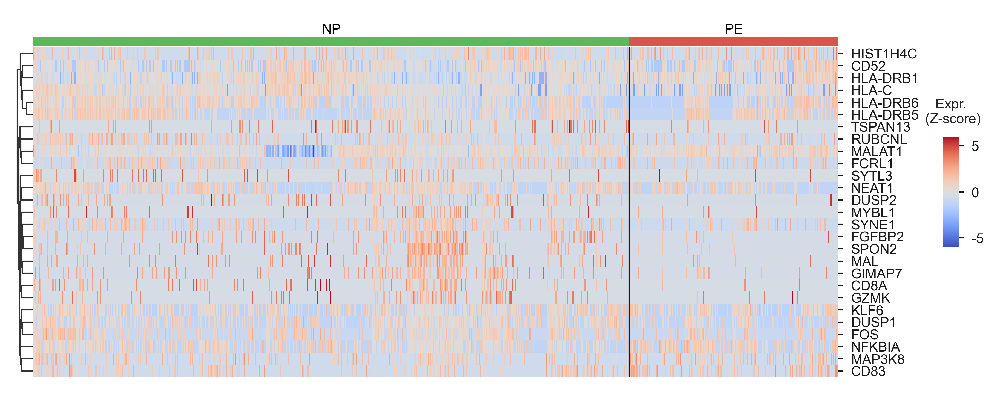

In [149]:
cell_types = ['Total_B', 'Total_T_NK', 'Total_Mono', 'cd4_tn2', 'cd8_tn2','Treg']
cell_type = cell_types[0]
final_f=res[cell_type]['feat_impt_ord']['feat']
figs_size=(6.5, 0.1*len(final_f))
fontsize=6
plot_clustermap(cell_type, res, adata_prep,final_f, figs_size, fontsize=fontsize)
plt.savefig("plots/Fig_heatmap_{}_sc.jpg".format(cell_type), dpi=400, bbox_inches='tight', pad_inches = 0.1)

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
FixedFormatter should only be used together with FixedLocator


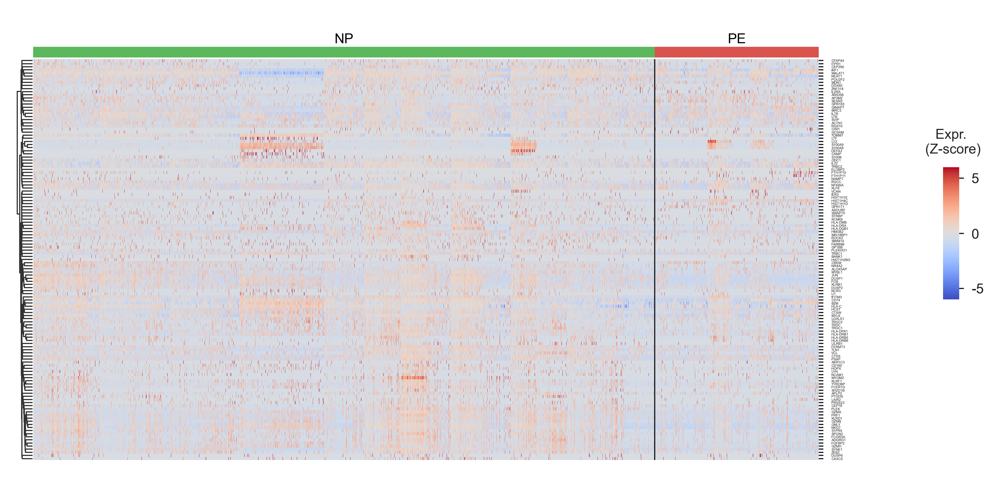

In [159]:
cell_types = ['Total_B', 'Total_T_NK', 'Total_Mono', 'cd4_tn2', 'cd8_tn2','Treg']
cell_type = cell_types[1]
final_f=res[cell_type]['feat_impt_ord']['feat']
figs_size=(6.5, 0.025*len(final_f))
fontsize=1.5
plot_clustermap(cell_type, res, adata_prep,final_f, figs_size, fontsize=fontsize)
plt.savefig("plots/Fig_heatmap_{}_sc.jpg".format(cell_type), dpi=400, bbox_inches='tight', pad_inches = 0.1)

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
FixedFormatter should only be used together with FixedLocator


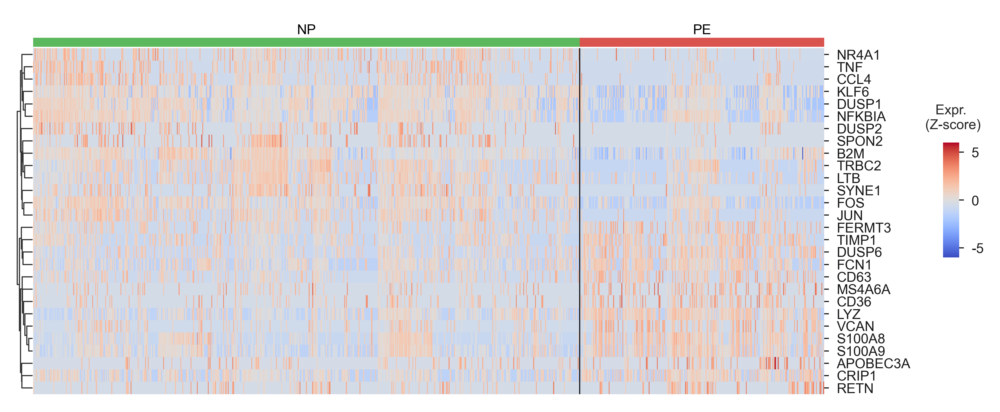

In [162]:
cell_types = ['Total_B', 'Total_T_NK', 'Total_Mono', 'cd4_tn2', 'cd8_tn2','Treg']
cell_type = cell_types[2]
final_f=res[cell_type]['feat_impt_ord']['feat']
figs_size=(6.5, 0.1*len(final_f))
fontsize=6
plot_clustermap(cell_type, res, adata_prep,final_f, figs_size, fontsize=fontsize)
plt.savefig("plots/Fig_heatmap_{}_sc.jpg".format(cell_type), dpi=400, bbox_inches='tight', pad_inches = 0.1)

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
FixedFormatter should only be used together with FixedLocator


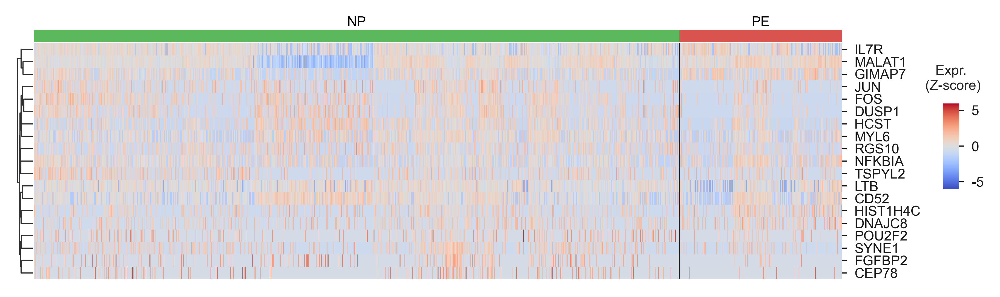

In [180]:
cell_types = ['Total_B', 'Total_T_NK', 'Total_Mono', 'cd4_tn2', 'cd8_tn2','Treg']
cell_type = cell_types[3]
final_f=res[cell_type]['feat_impt_ord']['feat']
figs_size=(6.5, 0.11*len(final_f))
fontsize=6
plot_clustermap(cell_type, res, adata_prep,final_f, figs_size, fontsize=fontsize)
plt.savefig("plots/Fig_heatmap_{}_sc.jpg".format(cell_type), dpi=400, bbox_inches='tight', pad_inches = 0.1)

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
FixedFormatter should only be used together with FixedLocator


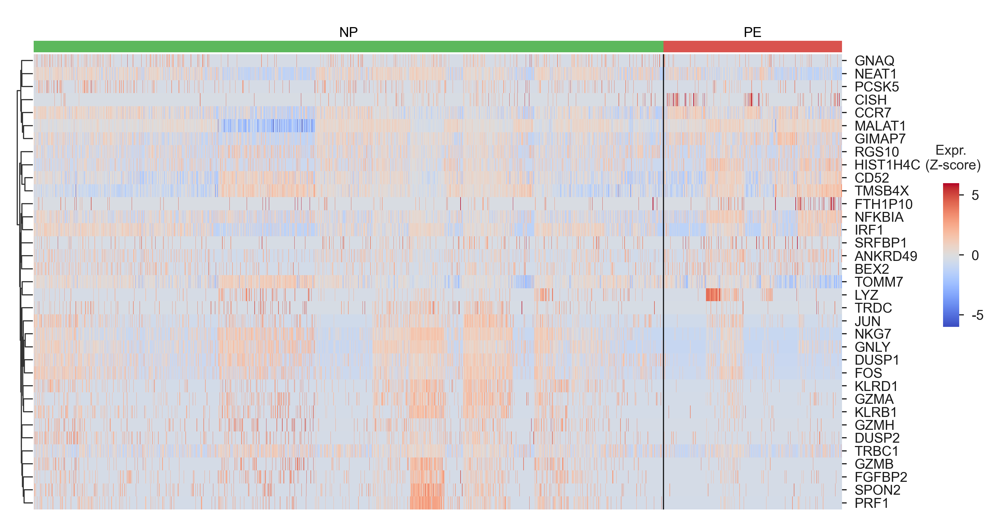

In [168]:
cell_types = ['Total_B', 'Total_T_NK', 'Total_Mono', 'cd4_tn2', 'cd8_tn2','Treg']
cell_type = cell_types[4]
final_f=res[cell_type]['feat_impt_ord']['feat']
figs_size=(6.5, 0.1*len(final_f))
fontsize=6
plot_clustermap(cell_type, res, adata_prep,final_f, figs_size, fontsize=fontsize)
plt.savefig("plots/Fig_heatmap_{}_sc.jpg".format(cell_type), dpi=400, bbox_inches='tight', pad_inches = 0.1)

FixedFormatter should only be used together with FixedLocator


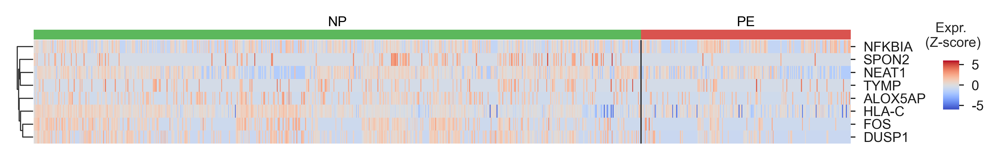

In [175]:
cell_types = ['Total_B', 'Total_T_NK', 'Total_Mono', 'cd4_tn2', 'cd8_tn2','Treg']
cell_type = cell_types[5]
final_f=res[cell_type]['feat_impt_ord']['feat']
figs_size=(6.5, 0.15*len(final_f))
fontsize=6
plot_clustermap(cell_type, res, adata_prep,final_f, figs_size, fontsize=fontsize)
plt.savefig("plots/Fig_heatmap_{}_sc.jpg".format(cell_type), dpi=400, bbox_inches='tight', pad_inches = 0.1)